In [12]:
!pip install Pillow==9.5.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 23.7 MB/s eta 0:00:00
  Attempting uninstall: Pillow
    Found existing installation: pillow 11.0.0
    Uninstalling pillow-11.0.0:
      Successfully uninstalled pillow-11.0.0


In [1]:
import numpy as np
import tensorflow as tf
import zipfile
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps
from IPython.display import display as ds
import shutil
import requests

In [8]:
local_zip = '/content/save_model.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('./')
zip_ref.close()

In [2]:
def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

In [3]:
label_map = {0:"Nutrition Fact Label"}

def draw_boxes_s(
     image,
     class_names,
     boxes,
     scores,
     score_limit):
  now_image_np=np.zeros((image.shape))
  np.copyto(now_image_np , image)

  for i in range(0,len(boxes)):
    if(float(scores[i])>score_limit):
      box , score , class_name = boxes[i] , scores[i] , class_names[i]
      class_name=label_map[class_name]
      ymin, xmin, ymax, xmax = tuple(box)
      colors = list(ImageColor.colormap.values())

      font = ImageFont.load_default()
      display_str = (class_name+":"+str(score))
      color = colors[hash(class_name) % len(colors)]

      image_pil = Image.fromarray(np.uint8(now_image_np)).convert("RGB")

      draw_bounding_box_on_image(
            image_pil,
            ymin,
            xmin,
            ymax,
            xmax,
            color,
            font,
            display_str_list=[display_str])

      np.copyto(now_image_np, np.array(image_pil) )

  ds(Image.fromarray(np.uint8( np.array(now_image_np) )).convert("RGB") )

In [4]:
def img_to_tensor(img_np):
  img_tf = tf.convert_to_tensor(img_np, dtype=tf.float32 )
  img_tf = tf.expand_dims(img_tf, axis=0)
  return img_tf

def img_proccess(img):
  img = Image.open(img)

  detection_img = img.resize((640,640))
  detection_img = np.array(detection_img)

  img = np.array(img)
  origin_img = np.zeros(img.shape)

  np.copyto(origin_img ,img)

  detection_img = img_to_tensor(detection_img)

  return {'origin_img_np':origin_img , 'detection_img_tensor':detection_img}

In [5]:
model=tf.saved_model.load('./save_model')

In [6]:
model.signatures['detect']

<ConcreteFunction (*, input_tensor: TensorSpec(shape=(None, 640, 640, 3), dtype=tf.float32, name='input_tensor')) -> Dict[['raw_detection_boxes', TensorSpec(shape=(None, None, 4), dtype=tf.float32, name='raw_detection_boxes')], ['detection_multiclass_scores', TensorSpec(shape=(None, 100, 2), dtype=tf.float32, name='detection_multiclass_scores')], ['detection_classes', TensorSpec(shape=(None, 100), dtype=tf.float32, name='detection_classes')], ['detection_boxes', TensorSpec(shape=(None, 100, 4), dtype=tf.float32, name='detection_boxes')], ['raw_detection_scores', TensorSpec(shape=(None, None, 2), dtype=tf.float32, name='raw_detection_scores')], ['num_detections', TensorSpec(shape=(None,), dtype=tf.float32, name='num_detections')], ['detection_anchor_indices', TensorSpec(shape=(None, 100), dtype=tf.int32, name='detection_anchor_indices')], ['detection_scores', TensorSpec(shape=(None, 100), dtype=tf.float32, name='detection_scores')]] at 0x7DA15E956E00>

<ipython-input-2-3e9dfd0f0d57>:23: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
<ipython-input-2-3e9dfd0f0d57>:33: DeprecationWarning: getsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use getbbox or getlength instead.
  text_width, text_height = font.getsize(display_str)


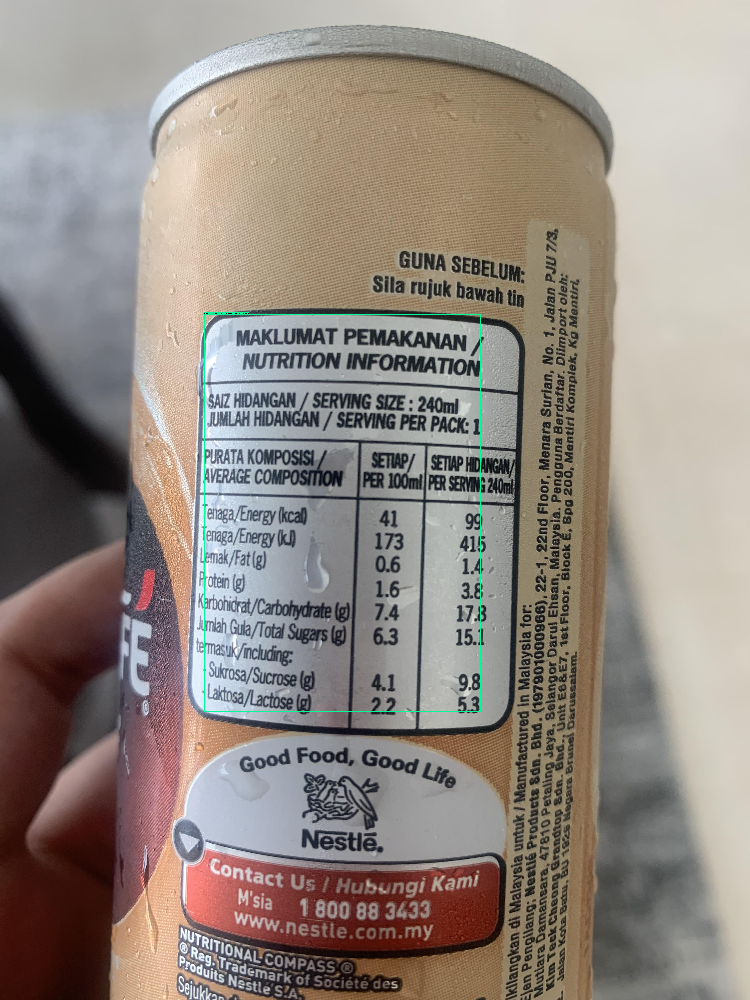

In [11]:
path_test_img = "/content/5ojts0iauak51_jpg.rf.3cf1d264bc6689ab0f8790c268748254.jpg"
path_test_img = img_proccess(path_test_img)

detections= model.signatures['detect'](path_test_img["detection_img_tensor"])

draw_boxes_s(
    path_test_img['origin_img_np'],
    detections['detection_classes'][0].numpy(),
    detections['detection_boxes'][0].numpy(),
    detections["detection_scores"][0].numpy(),
    0.8)